# Name: Zizhao He

# Part 1: Exploring Evictions and Code Violations in Philadelphia

# 1.1 Explore Eviction Lab Data

In [150]:
import geopandas as gpd
import pandas as pd
import numpy as np

# 1.1.1 Read data using geopandas

In [151]:
PATracts = gpd.read_file("https://eviction-lab-data-downloads.s3.amazonaws.com/PA/tracts.geojson")

In [152]:
PATracts.head()

,GEOID,west,south,east,north,n,pl,p-00,pr-00,roh-00,...,pm-16,po-16,ef-16,e-16,er-16,efr-16,lf-16,imputed-16,subbed-16,geometry
0,42003412002,-80.1243,40.5422,-80.0640,40.5890,4120.02,"Allegheny County, Pennsylvania",4748.59,0.88,58.0,...,0.00,0.0,0.0,0.0,0.00,0.00,1.0,0.0,1.0,"(POLYGON ((-80.06670099999999 40.584012, -80.0..."
1,42003413100,-80.0681,40.5850,-79.9906,40.6143,4131,"Allegheny County, Pennsylvania",6771.01,3.47,729.0,...,1.59,0.0,12.0,2.0,0.27,1.62,1.0,0.0,1.0,"(POLYGON ((-80.068057 40.612536, -80.054520999..."
2,42003413300,-80.0657,40.5527,-80.0210,40.5721,4133,"Allegheny County, Pennsylvania",5044.59,2.99,119.0,...,0.95,0.0,4.0,1.0,0.49,1.96,1.0,0.0,1.0,"(POLYGON ((-80.03821600000001 40.553495, -80.0..."
3,42003416000,-79.8113,40.5440,-79.7637,40.5630,4160,"Allegheny County, Pennsylvania",1775.93,4.99,121.0,...,0.55,0.0,1.0,1.0,0.65,0.65,1.0,0.0,1.0,"(POLYGON ((-79.765946 40.550915, -79.765415 40..."
4,42003417200,-79.7948,40.5341,-79.7642,40.5443,4172,"Allegheny County, Pennsylvania",1428.03,11.95,321.0,...,0.00,0.0,7.0,3.0,0.82,1.90,1.0,0.0,1.0,"(POLYGON ((-79.771137 40.544153, -79.764172 40..."


# 1.1.2 Explore and trim the data

In [153]:
valid_county = ['Philadelphia County, Pennsylvania']

In [154]:
selection = PATracts['pl'].isin(valid_county)
PhillyTracts = PATracts.loc[selection]

In [155]:
PhillyTracts

,GEOID,west,south,east,north,n,pl,p-00,pr-00,roh-00,...,pm-16,po-16,ef-16,e-16,er-16,efr-16,lf-16,imputed-16,subbed-16,geometry
435,42101000100,-75.1523,39.9481,-75.1415,39.9569,1,"Philadelphia County, Pennsylvania",2646.71,9.26,1347.0,...,2.49,0.00,25.0,16.0,0.93,1.45,0.0,0.0,1.0,"(POLYGON ((-75.14160699999999 39.955491, -75.1..."
436,42101000200,-75.1631,39.9529,-75.1511,39.9578,2,"Philadelphia County, Pennsylvania",1362.00,56.42,374.0,...,2.27,0.00,11.0,8.0,0.95,1.30,0.0,0.0,1.0,"(POLYGON ((-75.151223 39.956862, -75.151669 39..."
437,42101000300,-75.1798,39.9544,-75.1623,39.9599,3,"Philadelphia County, Pennsylvania",2570.00,12.16,861.0,...,1.76,0.00,26.0,14.0,0.73,1.35,0.0,0.0,1.0,"(POLYGON ((-75.162339 39.957825, -75.162374 39..."
438,42101000801,-75.1833,39.9486,-75.1773,39.9515,8.01,"Philadelphia County, Pennsylvania",1478.00,14.40,810.0,...,1.42,3.78,13.0,4.0,0.51,1.64,0.0,0.0,1.0,"(POLYGON ((-75.177323 39.950964, -75.177843 39..."
439,42101000804,-75.1712,39.9470,-75.1643,39.9501,8.04,"Philadelphia County, Pennsylvania",3301.00,14.40,2058.0,...,0.19,0.35,22.0,7.0,0.33,1.04,0.0,0.0,1.0,"(POLYGON ((-75.17118000000001 39.947784, -75.1..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3200,42101017800,-75.1255,39.9869,-75.1095,39.9965,178,"Philadelphia County, Pennsylvania",6340.00,54.31,899.0,...,1.82,0.37,178.0,104.0,7.93,13.57,0.0,0.0,1.0,"(POLYGON ((-75.113387 39.996493, -75.111369 39..."
3201,42101017900,-75.1224,39.9815,-75.1059,39.9921,179,"Philadelphia County, Pennsylvania",6050.00,32.21,568.0,...,1.66,0.00,121.0,80.0,7.77,11.75,0.0,0.0,1.0,"(POLYGON ((-75.105915 39.988037, -75.108358999..."
3202,42101018002,-75.1112,39.9790,-75.1014,39.9880,180.02,"Philadelphia County, Pennsylvania",5471.00,16.33,519.0,...,0.00,0.00,41.0,32.0,4.24,5.43,0.0,0.0,1.0,"(POLYGON ((-75.105064 39.987073, -75.104365 39..."
3203,42101018300,-75.0865,39.9838,-75.0654,40.0056,183,"Philadelphia County, Pennsylvania",4008.00,10.01,184.0,...,0.24,0.00,12.0,7.0,2.40,4.11,0.0,0.0,1.0,(POLYGON ((-75.06581466910771 39.9862895182783...


# 1.1.3 Transform from wide to tidy format

In [156]:
Eviction = pd.melt(PhillyTracts, id_vars=['GEOID','geometry'], value_name = 'Evictions', value_vars = ['e-{:02d}'.format(x) for x in range(3, 17)], var_name = 'Original')

In [157]:
Eviction

,GEOID,geometry,Original,Evictions
0,42101000100,"(POLYGON ((-75.14160699999999 39.955491, -75.1...",e-03,21.0
1,42101000200,"(POLYGON ((-75.151223 39.956862, -75.151669 39...",e-03,3.0
2,42101000300,"(POLYGON ((-75.162339 39.957825, -75.162374 39...",e-03,17.0
3,42101000801,"(POLYGON ((-75.177323 39.950964, -75.177843 39...",e-03,13.0
4,42101000804,"(POLYGON ((-75.17118000000001 39.947784, -75.1...",e-03,21.0
...,...,...,...,...
5371,42101017800,"(POLYGON ((-75.113387 39.996493, -75.111369 39...",e-16,104.0
5372,42101017900,"(POLYGON ((-75.105915 39.988037, -75.108358999...",e-16,80.0
5373,42101018002,"(POLYGON ((-75.105064 39.987073, -75.104365 39...",e-16,32.0
5374,42101018300,(POLYGON ((-75.06581466910771 39.9862895182783...,e-16,7.0


In [158]:
annual_Eviction = Eviction.groupby(['Original'])['Evictions'].sum()

In [159]:
annual_Eviction

Original
e-03    10647.0
e-04    10491.0
e-05    10550.0
e-06    11078.0
e-07    11032.0
e-08    10866.0
e-09     9821.0
e-10    10628.0
e-11    10882.0
e-12    11130.0
e-13    10803.0
e-14    11182.0
e-15    10098.0
e-16    10264.0
Name: Evictions, dtype: float64

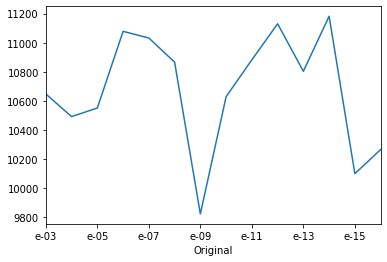

In [16]:
#annual_Eviction.plot()

# 1.1.4 Plot the total number of evictions per year from 2003 to 2016

In [160]:
import hvplot.pandas

Line Chart

In [161]:
Line = annual_Eviction.hvplot(kind='line')
Line

:Curve   [Original]   (Evictions)

Bar Chart

In [162]:
Bar = annual_Eviction.hvplot(kind='bar', rot=90, width=1000)
Bar

:Bars   [Original]   (Evictions)

# 1.1.5 The number of evictions across Philadelphia

In [163]:
choropleth = Eviction.hvplot(c='Evictions', groupby='Original', dynamic=False, geo=True, height=500, width=500)

choropleth

:HoloMap   [Original]
   :Polygons   [Longitude,Latitude]   (GEOID,Original,Evictions)

# 1.2 Code Violations in Philadelphia

# 1.2.1 Load data from 2012 to 2016

In [164]:
LI_Violation = pd.read_csv("C:/Users/alber/OneDrive/Desktop/MUSA620/HW3/assignment-3-zizhaohe-master/data/li_violations.csv",sep=',',engine='python')

In [165]:
LI_Violation.head()

,lat,lng,violationdescription
0,40.050526,-75.126076,CLIP VIOLATION NOTICE
1,40.050593,-75.126578,LICENSE-CHANGE OF ADDRESS
2,40.050593,-75.126578,LICENSE-RES SFD/2FD
3,39.991994,-75.128895,EXT A-CLEAN WEEDS/PLANTS
4,40.023260,-75.164848,EXT A-VACANT LOT CLEAN/MAINTAI


# 1.2.2 Trim to specific violation types

In [166]:
Valid_Violation = ['INT-PLMBG MAINT FIXTURES-RES',
 'INT S-CEILING REPAIR/MAINT SAN',
 'PLUMBING SYSTEMS-GENERAL',
 'CO DETECTOR NEEDED',
 'INTERIOR SURFACES',
 'EXT S-ROOF REPAIR',
 'ELEC-RECEPTABLE DEFECTIVE-RES',
 'INT S-FLOOR REPAIR',
 'DRAINAGE-MAIN DRAIN REPAIR-RES',
 'DRAINAGE-DOWNSPOUT REPR/REPLC',
 'LIGHT FIXTURE DEFECTIVE-RES',
 'LICENSE-RES SFD/2FD',
 'ELECTRICAL -HAZARD',
 'VACANT PROPERTIES-GENERAL',
 'INT-PLMBG FIXTURES-RES']

In [167]:
selection = LI_Violation['violationdescription'].isin(Valid_Violation)
Violation_trimmed = LI_Violation.loc[selection]

In [168]:
Violation_trimmed

,lat,lng,violationdescription
2,40.050593,-75.126578,LICENSE-RES SFD/2FD
25,40.022406,-75.121872,EXT S-ROOF REPAIR
30,40.023237,-75.121726,CO DETECTOR NEEDED
31,40.023397,-75.122241,INT S-CEILING REPAIR/MAINT SAN
34,40.023773,-75.121603,INT S-FLOOR REPAIR
...,...,...,...
433982,39.962287,-75.226644,CO DETECTOR NEEDED
433985,39.968669,-75.212576,CO DETECTOR NEEDED
434013,39.950209,-75.227244,INT S-CEILING REPAIR/MAINT SAN
434043,39.936179,-75.192078,INT S-FLOOR REPAIR


In [169]:
Violation = Violation_trimmed.dropna(subset=['lat', 'lng'])
Violation['Coordinates'] = list(zip(Violation['lng'], Violation['lat']))

In [170]:
Violation['Coordinates'].head()

2      (-75.12657800000001, 40.050593)
25             (-75.121872, 40.022406)
30             (-75.121726, 40.023237)
31    (-75.122241, 40.023396999999996)
34     (-75.12160300000001, 40.023773)
Name: Coordinates, dtype: object

In [171]:
from shapely.geometry import Point
Violation['Coordinates'] = Violation['Coordinates'].apply(Point)
Violation['Coordinates'].head()

2     POINT (-75.12657800000001 40.050593)
25            POINT (-75.121872 40.022406)
30            POINT (-75.121726 40.023237)
31            POINT (-75.122241 40.023397)
34    POINT (-75.12160300000001 40.023773)
Name: Coordinates, dtype: object

In [172]:
# Convert to a GeoDataFrame
Violation = gpd.GeoDataFrame(Violation, geometry="Coordinates", crs={"init": "epsg:32618"})
Violation

,lat,lng,violationdescription,Coordinates
2,40.050593,-75.126578,LICENSE-RES SFD/2FD,POINT (-75.12657800000001 40.050593)
25,40.022406,-75.121872,EXT S-ROOF REPAIR,POINT (-75.121872 40.022406)
30,40.023237,-75.121726,CO DETECTOR NEEDED,POINT (-75.121726 40.023237)
31,40.023397,-75.122241,INT S-CEILING REPAIR/MAINT SAN,POINT (-75.122241 40.023397)
34,40.023773,-75.121603,INT S-FLOOR REPAIR,POINT (-75.12160300000001 40.023773)
...,...,...,...,...
433982,39.962287,-75.226644,CO DETECTOR NEEDED,POINT (-75.22664399999999 39.962287)
433985,39.968669,-75.212576,CO DETECTOR NEEDED,POINT (-75.212576 39.968669)
434013,39.950209,-75.227244,INT S-CEILING REPAIR/MAINT SAN,POINT (-75.227244 39.950209)
434043,39.936179,-75.192078,INT S-FLOOR REPAIR,POINT (-75.19207800000001 39.936179)


In [173]:
Eviction_Geo = gpd.GeoDataFrame(Eviction, geometry="geometry", crs={"init": "epsg:32618"})
Eviction_Geo

,GEOID,geometry,Original,Evictions
0,42101000100,"(POLYGON ((-75.14160699999999 39.955491, -75.1...",e-03,21.0
1,42101000200,"(POLYGON ((-75.151223 39.956862, -75.151669 39...",e-03,3.0
2,42101000300,"(POLYGON ((-75.162339 39.957825, -75.162374 39...",e-03,17.0
3,42101000801,"(POLYGON ((-75.177323 39.950964, -75.177843 39...",e-03,13.0
4,42101000804,"(POLYGON ((-75.17118000000001 39.947784, -75.1...",e-03,21.0
...,...,...,...,...
5371,42101017800,"(POLYGON ((-75.113387 39.996493, -75.111369 39...",e-16,104.0
5372,42101017900,"(POLYGON ((-75.105915 39.988037, -75.108358999...",e-16,80.0
5373,42101018002,"(POLYGON ((-75.105064 39.987073, -75.104365 39...",e-16,32.0
5374,42101018300,(POLYGON ((-75.06581466910771 39.9862895182783...,e-16,7.0


# 1.2.3 Make a hex bin map

In [174]:
import cartopy.crs as ccrs
from matplotlib import pyplot as plt

%matplotlib inline

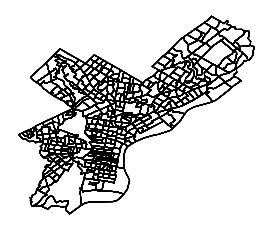

In [175]:
# Plot for the geometry boundary
ax = Eviction_Geo.plot(facecolor='none', edgecolor='black')
ax.set_axis_off()
ax.set_aspect("equal")

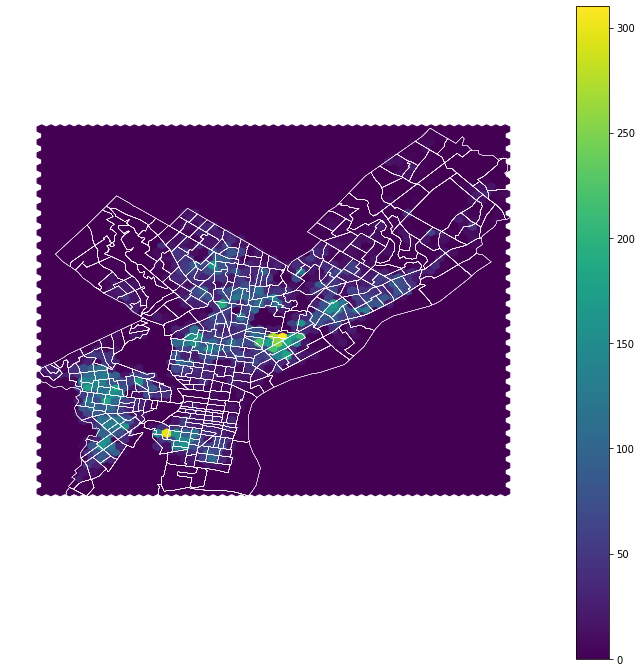

In [176]:
# create the axes
fig, ax = plt.subplots(figsize=(12, 12))

# use the .x and .y attributes
vals = ax.hexbin(Violation.geometry.x, Violation.geometry.y, gridsize=50)

# add the eviction geometry boundaries
Eviction_Geo.plot(ax=ax, facecolor="none", edgecolor="white", linewidth=0.1)

# add a colorbar and format
plt.colorbar(vals)
ax.set_axis_off()
ax.set_aspect("equal")

# 1.2.4 Spatially join data sets

In [177]:
# Remove unwanted columns
unwanted = ['Original', 'Evictions']
eviction_df = Eviction_Geo.drop(unwanted, axis=1)
eviction_df

,GEOID,geometry
0,42101000100,"(POLYGON ((-75.14160699999999 39.955491, -75.1..."
1,42101000200,"(POLYGON ((-75.151223 39.956862, -75.151669 39..."
2,42101000300,"(POLYGON ((-75.162339 39.957825, -75.162374 39..."
3,42101000801,"(POLYGON ((-75.177323 39.950964, -75.177843 39..."
4,42101000804,"(POLYGON ((-75.17118000000001 39.947784, -75.1..."
...,...,...
5371,42101017800,"(POLYGON ((-75.113387 39.996493, -75.111369 39..."
5372,42101017900,"(POLYGON ((-75.105915 39.988037, -75.108358999..."
5373,42101018002,"(POLYGON ((-75.105064 39.987073, -75.104365 39..."
5374,42101018300,(POLYGON ((-75.06581466910771 39.9862895182783...


In [178]:
# Change CRS
eviction_df = eviction_df.to_crs(epsg=32618)
Violation = Violation.to_crs(epsg=32618)
Violation

,lat,lng,violationdescription,Coordinates
2,40.050593,-75.126578,LICENSE-RES SFD/2FD,POINT (-75.12657799985027 40.05059299999999)
25,40.022406,-75.121872,EXT S-ROOF REPAIR,POINT (-75.12187199940672 40.022406)
30,40.023237,-75.121726,CO DETECTOR NEEDED,POINT (-75.12172599928454 40.02323699999999)
31,40.023397,-75.122241,INT S-CEILING REPAIR/MAINT SAN,POINT (-75.12224100041203 40.02339699999999)
34,40.023773,-75.121603,INT S-FLOOR REPAIR,POINT (-75.12160299980314 40.023773)
...,...,...,...,...
433982,39.962287,-75.226644,CO DETECTOR NEEDED,POINT (-75.22664400015492 39.962287)
433985,39.968669,-75.212576,CO DETECTOR NEEDED,POINT (-75.21257599943783 39.968669)
434013,39.950209,-75.227244,INT S-CEILING REPAIR/MAINT SAN,POINT (-75.22724400059087 39.95020899999999)
434043,39.936179,-75.192078,INT S-FLOOR REPAIR,POINT (-75.19207799970172 39.936179)


In [179]:
# Spatial Join
joined = gpd.sjoin(Violation, eviction_df, op='within', how='left')
joined.head()

,lat,lng,violationdescription,Coordinates,index_right,GEOID
2,40.050593,-75.126578,LICENSE-RES SFD/2FD,POINT (-75.12657799985027 40.05059299999999),364,42101027100
2,40.050593,-75.126578,LICENSE-RES SFD/2FD,POINT (-75.12657799985027 40.05059299999999),748,42101027100
2,40.050593,-75.126578,LICENSE-RES SFD/2FD,POINT (-75.12657799985027 40.05059299999999),1132,42101027100
2,40.050593,-75.126578,LICENSE-RES SFD/2FD,POINT (-75.12657799985027 40.05059299999999),1516,42101027100
2,40.050593,-75.126578,LICENSE-RES SFD/2FD,POINT (-75.12657799985027 40.05059299999999),1900,42101027100


# 1.2.5 Calculate the number of violations by type per census tract

In [180]:
joined['N'] = 1
joined.head()

,lat,lng,violationdescription,Coordinates,index_right,GEOID,N
2,40.050593,-75.126578,LICENSE-RES SFD/2FD,POINT (-75.12657799985027 40.05059299999999),364,42101027100,1
2,40.050593,-75.126578,LICENSE-RES SFD/2FD,POINT (-75.12657799985027 40.05059299999999),748,42101027100,1
2,40.050593,-75.126578,LICENSE-RES SFD/2FD,POINT (-75.12657799985027 40.05059299999999),1132,42101027100,1
2,40.050593,-75.126578,LICENSE-RES SFD/2FD,POINT (-75.12657799985027 40.05059299999999),1516,42101027100,1
2,40.050593,-75.126578,LICENSE-RES SFD/2FD,POINT (-75.12657799985027 40.05059299999999),1900,42101027100,1


In [181]:
ViolationPerCT = joined.groupby(['violationdescription','GEOID']).N.sum().unstack(fill_value=0).stack().reset_index(name='N')
ViolationPerCT

,violationdescription,GEOID,N
0,CO DETECTOR NEEDED,42101000100,0
1,CO DETECTOR NEEDED,42101000200,0
2,CO DETECTOR NEEDED,42101000300,0
3,CO DETECTOR NEEDED,42101000401,14
4,CO DETECTOR NEEDED,42101000402,14
...,...,...,...
5530,VACANT PROPERTIES-GENERAL,42101980100,0
5531,VACANT PROPERTIES-GENERAL,42101980500,0
5532,VACANT PROPERTIES-GENERAL,42101980700,0
5533,VACANT PROPERTIES-GENERAL,42101980800,0


# 1.2.6 Merge with census tracts geometries

In [182]:
# Remove the duplicates
eviction_df2 = eviction_df.drop_duplicates(subset = 'GEOID', keep = 'first', inplace = False)

In [183]:
Merged = eviction_df2.merge(ViolationPerCT, on='GEOID')
Merged = Merged.rename(columns={'violationdescription': 'Violation Type', 'N': 'Occurances Number'})
Merged

,GEOID,geometry,Violation Type,Occurances Number
0,42101000100,(POLYGON ((-75.14160700002685 39.9554909999999...,CO DETECTOR NEEDED,0
1,42101000100,(POLYGON ((-75.14160700002685 39.9554909999999...,DRAINAGE-DOWNSPOUT REPR/REPLC,84
2,42101000100,(POLYGON ((-75.14160700002685 39.9554909999999...,DRAINAGE-MAIN DRAIN REPAIR-RES,0
3,42101000100,(POLYGON ((-75.14160700002685 39.9554909999999...,ELEC-RECEPTABLE DEFECTIVE-RES,0
4,42101000100,(POLYGON ((-75.14160700002685 39.9554909999999...,ELECTRICAL -HAZARD,14
...,...,...,...,...
5530,42101018400,(POLYGON ((-75.05901699943934 39.9925119999999...,INTERIOR SURFACES,28
5531,42101018400,(POLYGON ((-75.05901699943934 39.9925119999999...,LICENSE-RES SFD/2FD,154
5532,42101018400,(POLYGON ((-75.05901699943934 39.9925119999999...,LIGHT FIXTURE DEFECTIVE-RES,0
5533,42101018400,(POLYGON ((-75.05901699943934 39.9925119999999...,PLUMBING SYSTEMS-GENERAL,28


# 1.2.7 Interactive choropleths for each violation type

In [184]:
choropleth_vio = Merged.hvplot(c='Occurances Number', groupby='Violation Type', dynamic=False, geo=True, height=600, width=600)

choropleth_vio

:HoloMap   [Violation Type]
   :Polygons   [Longitude,Latitude]   (GEOID,Violation Type,Occurances Number)

# 1.3. A side-by-side comparison

* Trim the data frame plotted in section 1.1.5 to only include evictions from 2016

In [185]:
valid_year = ['e-16']
selection = Eviction['Original'].isin(valid_year)
Eviction_2016 = Eviction.loc[selection]

In [186]:
Eviction_2016

,GEOID,geometry,Original,Evictions
4992,42101000100,"(POLYGON ((-75.14160699999999 39.955491, -75.1...",e-16,16.0
4993,42101000200,"(POLYGON ((-75.151223 39.956862, -75.151669 39...",e-16,8.0
4994,42101000300,"(POLYGON ((-75.162339 39.957825, -75.162374 39...",e-16,14.0
4995,42101000801,"(POLYGON ((-75.177323 39.950964, -75.177843 39...",e-16,4.0
4996,42101000804,"(POLYGON ((-75.17118000000001 39.947784, -75.1...",e-16,7.0
...,...,...,...,...
5371,42101017800,"(POLYGON ((-75.113387 39.996493, -75.111369 39...",e-16,104.0
5372,42101017900,"(POLYGON ((-75.105915 39.988037, -75.108358999...",e-16,80.0
5373,42101018002,"(POLYGON ((-75.105064 39.987073, -75.104365 39...",e-16,32.0
5374,42101018300,(POLYGON ((-75.06581466910771 39.9862895182783...,e-16,7.0


* Trim the data frame plotted in section 1.2.7 to only include a single violation type

In [187]:
valid_type = ['DRAINAGE-DOWNSPOUT REPR/REPLC']
selection = Merged['Violation Type'].isin(valid_type)
Vio_DDRR = Merged.loc[selection]

In [189]:
Vio_DDRR

,GEOID,geometry,Violation Type,Occurances Number
1,42101000100,(POLYGON ((-75.14160700002685 39.9554909999999...,DRAINAGE-DOWNSPOUT REPR/REPLC,84
16,42101000200,"(POLYGON ((-75.15122299961513 39.956862, -75.1...",DRAINAGE-DOWNSPOUT REPR/REPLC,14
31,42101000300,(POLYGON ((-75.16233899921644 39.9578249999999...,DRAINAGE-DOWNSPOUT REPR/REPLC,28
46,42101000801,(POLYGON ((-75.17732299974887 39.9509639999999...,DRAINAGE-DOWNSPOUT REPR/REPLC,0
61,42101000804,(POLYGON ((-75.17118000064511 39.9477840000000...,DRAINAGE-DOWNSPOUT REPR/REPLC,0
...,...,...,...,...
5461,42101017800,(POLYGON ((-75.11338699987391 39.9964929999999...,DRAINAGE-DOWNSPOUT REPR/REPLC,196
5476,42101017900,"(POLYGON ((-75.105915000604 39.98803699999999,...",DRAINAGE-DOWNSPOUT REPR/REPLC,294
5491,42101018002,"(POLYGON ((-75.10506400006125 39.987073, -75.1...",DRAINAGE-DOWNSPOUT REPR/REPLC,56
5506,42101018300,(POLYGON ((-75.06581466918578 39.9862895182783...,DRAINAGE-DOWNSPOUT REPR/REPLC,42


* Choropleth for evictions in 2016

In [190]:
choropleth_Evi16 = Eviction_2016.hvplot(c='Evictions', dynamic=False, geo=True, height=500, width=500)

choropleth_Evi16

:Polygons   [Longitude,Latitude]   (GEOID,Original,Evictions)

* Choropleth for occurances of DRAINAGE-DOWNSPOUT REPR/REPLC

In [191]:
choropleth_DDRR = Vio_DDRR.hvplot(c='Occurances Number', dynamic=False, geo=True, height=500, width=500)

choropleth_DDRR

:Polygons   [Longitude,Latitude]   (GEOID,Violation Type,Occurances Number)

* Side by side comparison of the two choropleths

In [192]:
combined = choropleth_Evi16 + choropleth_DDRR
combined

:Layout
   .Polygons.I  :Polygons   [Longitude,Latitude]   (GEOID,Original,Evictions)
   .Polygons.II :Polygons   [Longitude,Latitude]   (GEOID,Violation Type,Occurances Number)

# Part 2: Exploring the NDVI in Philadelphia

In [193]:
import rasterio as rio

# 2.1.1 Load Landsat data for Philadelphia

In [194]:
# Open the file and get a file "handle"
landsat = rio.open("C:/Users/alber/OneDrive/Desktop/MUSA620/HW3/assignment-3-zizhaohe-master/data/landsat8_philly.tif")
landsat

<open DatasetReader name='C:/Users/alber/OneDrive/Desktop/MUSA620/HW3/assignment-3-zizhaohe-master/data/landsat8_philly.tif' mode='r'>

In [195]:
print(landsat.crs.data)
landsat.meta

{'init': 'epsg:32618'}


{'driver': 'GTiff',
 'dtype': 'uint16',
 'nodata': None,
 'width': 923,
 'height': 999,
 'count': 10,
 'crs': CRS.from_dict(init='epsg:32618'),
 'transform': Affine(30.0, 0.0, 476064.3596176505,
        0.0, -30.0, 4443066.927074196)}

In [196]:
# This is just a numpy array
data = landsat.read(1)
data

array([[10901, 10618, 10751, ..., 12145, 11540, 14954],
       [11602, 10718, 10546, ..., 11872, 11982, 12888],
       [10975, 10384, 10357, ..., 11544, 12318, 12456],
       ...,
       [12281, 12117, 12072, ..., 11412, 11724, 11088],
       [12747, 11866, 11587, ..., 11558, 12028, 10605],
       [11791, 11677, 10656, ..., 10615, 11557, 11137]], dtype=uint16)

In [197]:
import matplotlib.colors as mcolors

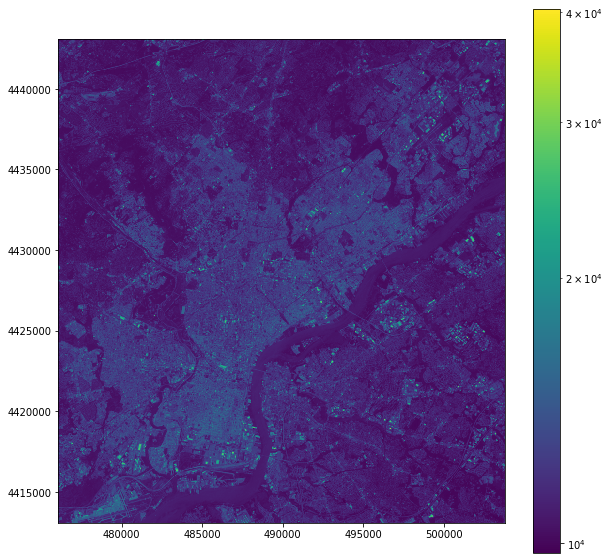

In [198]:
# Add the extent of landsat in the map
# Initialize
fig, ax = plt.subplots(figsize=(10, 10))

img = ax.imshow(
    data,
    norm=mcolors.LogNorm(),
    extent=[
        landsat.bounds.left,
        landsat.bounds.right,
        landsat.bounds.bottom,
        landsat.bounds.top,
    ],
)

# Add a colorbar
plt.colorbar(img)

# 2.1.2 Separating the city from the suburbs

In [199]:
CityLimits = gpd.read_file("C:/Users/alber/OneDrive/Desktop/MUSA620/HW3/assignment-3-zizhaohe-master/data/City_Limits.geojson")

In [200]:
# Convert the city limits polygon to a better CRS
CityLimits = CityLimits.to_crs(epsg=32618)

In [201]:
CityLimits

,OBJECTID,Shape__Area,Shape__Length,geometry
0,1,0.038911,1.259687,"POLYGON ((498724.959914474 4443066.927074197, ..."


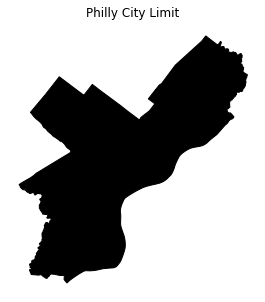

In [202]:
# City limits polygon
fig, ax = plt.subplots(figsize=(5, 5))
CityLimits.to_crs(epsg=32618).plot(ax=ax, facecolor="black", edgecolor="black")

ax.set_title("Philly City Limit")
ax.set_axis_off()
ax.set_aspect("equal")

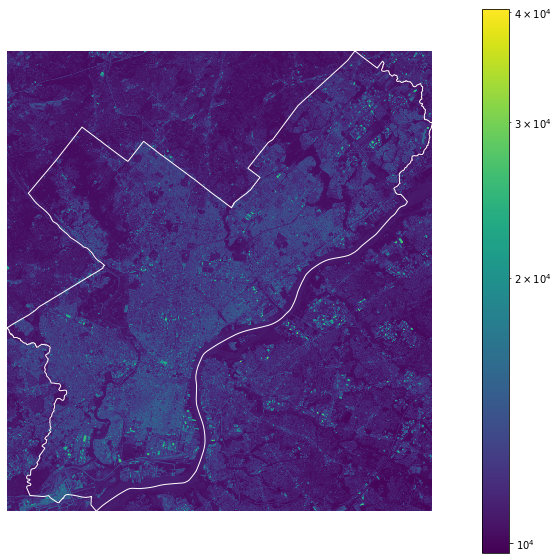

In [203]:
# Add city limits boundary on the map
# Initialize
fig, ax = plt.subplots(figsize=(10, 10))

landsat_extent = [
    landsat.bounds.left,
    landsat.bounds.right,
    landsat.bounds.bottom,
    landsat.bounds.top,
]

img = ax.imshow(data, norm=mcolors.LogNorm(), extent=landsat_extent)

# Add the city limits
CityLimits.plot(ax=ax, facecolor="none", edgecolor="white")
# Add a colorbar
plt.colorbar(img)
ax.set_axis_off()

In [204]:
from geopandas import GeoSeries
from shapely.geometry import Polygon

* Create an envelope polygon of the city polygon

In [205]:
Envelope = CityLimits['geometry'].envelope

In [206]:
Envelope = Envelope.to_crs(epsg=32618)

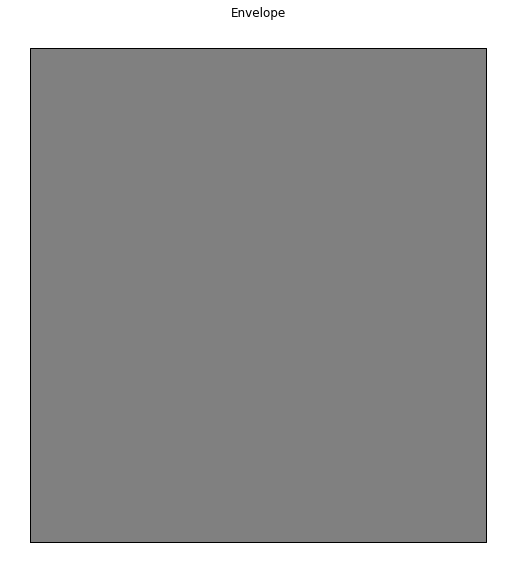

In [207]:
# Envelope Polygon
fig, ax = plt.subplots(figsize=(10, 10))
Envelope.to_crs(epsg=32618).plot(ax=ax, facecolor="grey", edgecolor="black")

ax.set_title("Envelope")
ax.set_axis_off()
ax.set_aspect("equal")

*  calculate the suburbs polygon from the city limits polygon and the envelope polygon

In [208]:
Suburb = Envelope.difference(CityLimits)

In [209]:
Suburb = Suburb.to_crs(epsg=32618)

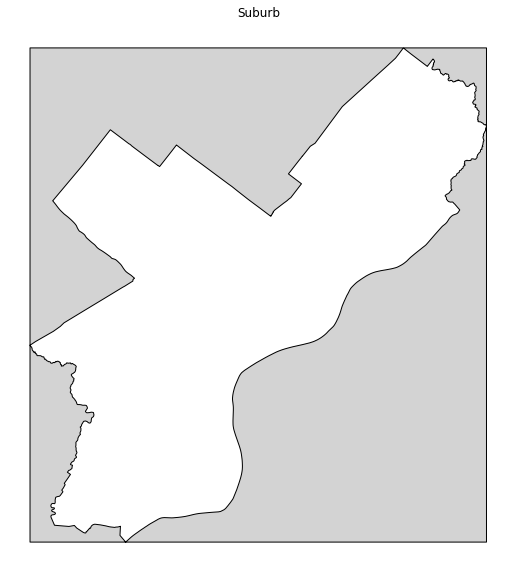

In [210]:
fig, ax = plt.subplots(figsize=(10, 10))
Suburb.to_crs(epsg=32618).plot(ax=ax, facecolor="lightgrey", edgecolor="black")

ax.set_title("Suburb")
ax.set_axis_off()
ax.set_aspect("equal")

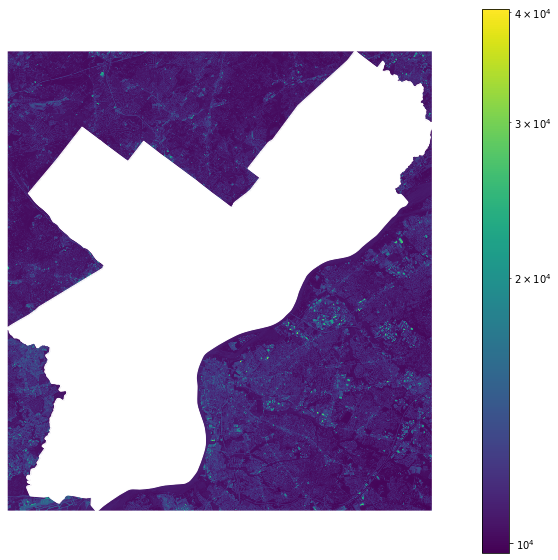

In [211]:
# Only show the suburb area on the map
# Initialize
fig, ax = plt.subplots(figsize=(10, 10))

landsat_extent = [
    landsat.bounds.left,
    landsat.bounds.right,
    landsat.bounds.bottom,
    landsat.bounds.top,
]

img = ax.imshow(data, norm=mcolors.LogNorm(), extent=landsat_extent)

# Add the city limits
CityLimits.plot(ax=ax, facecolor="white", edgecolor="white")
Suburb.plot(ax=ax, facecolor="none", edgecolor="white")

# Add a colorbar
plt.colorbar(img)
ax.set_axis_off()

# 2.1.3 Mask and calculate the NDVI for the city and the suburbs

In [212]:
from rasterio.mask import mask

* Mask for City

In [213]:
masked_City, mask_transform = mask(
    dataset=landsat, 
    shapes=CityLimits.geometry, 
    crop=True, # remove pixels not within boundary
    all_touched=True, # get all pixels that touch the boudnary
    filled=False # do not fill cropped pixels with a default value
)

In [214]:
masked_City

masked_array(
  data=[[[--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         ...,
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --]],

        [[--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         ...,
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --]],

        [[--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         ...,
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --]],

        ...,

        [[--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         ...,
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --,

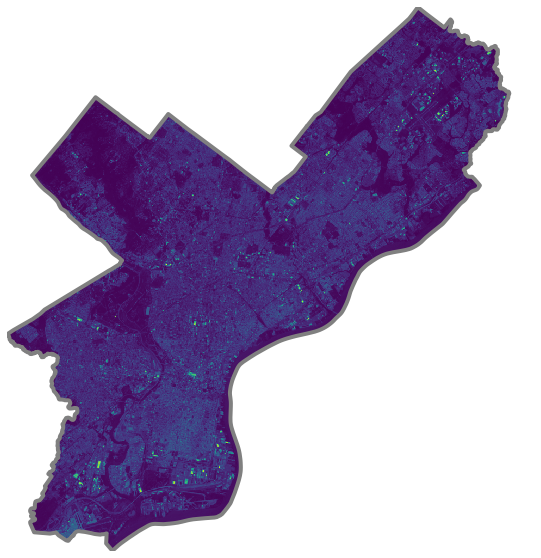

In [215]:
# Initialize
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the first band
plt.imshow(masked_City[0], cmap="viridis", extent=landsat_extent)

# Format and add the city limits
CityLimits.boundary.plot(ax=ax, color="gray", linewidth=4)
ax.set_axis_off()

In [216]:
landsat

<open DatasetReader name='C:/Users/alber/OneDrive/Desktop/MUSA620/HW3/assignment-3-zizhaohe-master/data/landsat8_philly.tif' mode='r'>

* calculate the NDVI for the city

In [217]:
# Note that the indexing here is zero-based, e.g., band 1 is index 0
red_1 = masked_City[3]
nir_1 = masked_City[4]

In [218]:
def calculate_NDVI_1(nir_1, red_1):
    """
    Calculate the NDVI from the NIR and red landsat bands
    """
    
    # Convert to floats
    nir_1 = nir_1.astype(float)
    red_1 = red_1.astype(float)
    
    # Get valid entries
    check = np.logical_and( red_1.mask == False, nir_1.mask == False )
    
    # Where the check is True, return the NDVI, else return NaN
    ndvi = np.where(check,  (nir_1 - red_1 ) / ( nir_1 + red_1 ), np.nan )
    return ndvi 

In [219]:
NDVI_City = calculate_NDVI_1(nir_1, red_1)

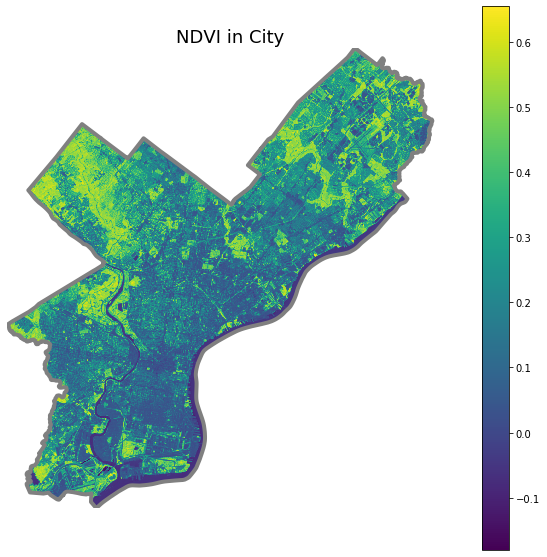

In [220]:
fig, ax = plt.subplots(figsize=(10,10))

# Plot NDVI
img = ax.imshow(NDVI_City, extent=landsat_extent)

# Format and plot city limits
CityLimits.plot(ax=ax, edgecolor='gray', facecolor='none', linewidth=4)
plt.colorbar(img)
ax.set_axis_off()
ax.set_title("NDVI in City", fontsize=18);

* Mask for Suburb

In [222]:
masked_Suburb, mask_transform = mask(
    dataset=landsat, 
    shapes=Suburb.geometry, 
    crop=True, # remove pixels not within boundary
    all_touched=True, # get all pixels that touch the boudnary
    filled=False # do not fill cropped pixels with a default value
)

In [223]:
masked_Suburb

masked_array(
  data=[[[10901, 10618, 10751, ..., 12145, 11540, 14954],
         [11602, 10718, 10546, ..., 11872, 11982, 12888],
         [10975, 10384, 10357, ..., 11544, 12318, 12456],
         ...,
         [12281, 12117, 12072, ..., 11412, 11724, 11088],
         [12747, 11866, 11587, ..., 11558, 12028, 10605],
         [11791, 11677, 10656, ..., 10615, 11557, 11137]],

        [[9909, 9598, 9764, ..., 11270, 10740, 15110],
         [10855, 9707, 9502, ..., 10959, 11065, 12241],
         [10060, 9337, 9274, ..., 10579, 11527, 11565],
         ...,
         [11569, 11467, 11226, ..., 10527, 10904, 10215],
         [12159, 11021, 10708, ..., 10821, 11300, 9679],
         [10899, 10845, 9558, ..., 9556, 10730, 10253]],

        [[9735, 8945, 9628, ..., 10618, 10730, 15725],
         [9940, 9378, 9034, ..., 9730, 10147, 11686],
         [9475, 8935, 8587, ..., 9654, 10485, 10829],
         ...,
         [11216, 11172, 11244, ..., 10131, 10544, 9737],
         [11712, 10706, 10037, ...

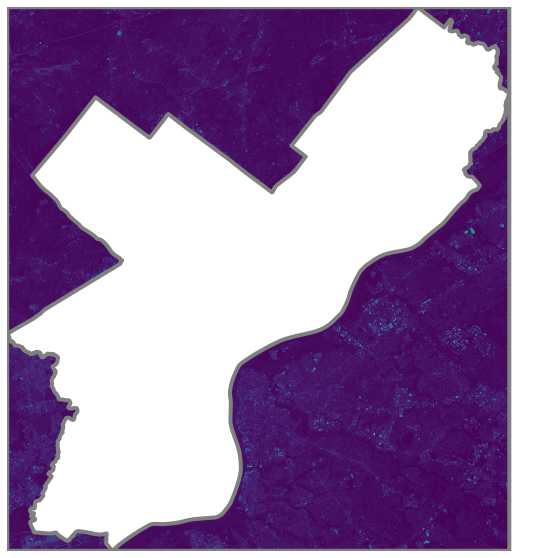

In [224]:
# Initialize
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the first band
plt.imshow(masked_Suburb[0], cmap="viridis", extent=landsat_extent)

# Format and add the city limits
Suburb.boundary.plot(ax=ax, color="gray", linewidth=4)
ax.set_axis_off()

* calculate the NDVI for the suburbs

In [225]:
# Note that the indexing here is zero-based, e.g., band 1 is index 0
red_2 = masked_Suburb[3]
nir_2 = masked_Suburb[4]

In [226]:
def calculate_NDVI_2(nir_2, red_2):
    """
    Calculate the NDVI from the NIR and red landsat bands
    """
    
    # Convert to floats
    nir_2 = nir_2.astype(float)
    red_2 = red_2.astype(float)
    
    # Get valid entries
    check = np.logical_and( red_2.mask == False, nir_2.mask == False )
    
    # Where the check is True, return the NDVI, else return NaN
    ndvi = np.where(check,  (nir_2 - red_2 ) / ( nir_2 + red_2 ), np.nan )
    return ndvi 

In [227]:
NDVI_Suburb = calculate_NDVI_2(nir_2, red_2)

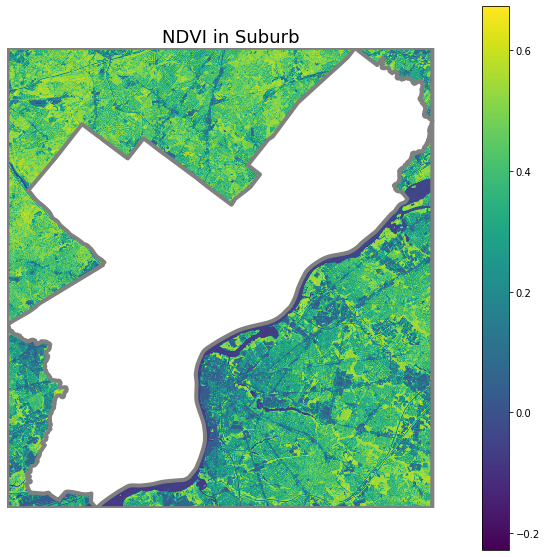

In [228]:
fig, ax = plt.subplots(figsize=(10,10))

# Plot NDVI
img = ax.imshow(NDVI_Suburb, extent=landsat_extent)

# Format and plot city limits
Suburb.plot(ax=ax, edgecolor='gray', facecolor='none', linewidth=4)
plt.colorbar(img)
ax.set_axis_off()
ax.set_title("NDVI in Suburb", fontsize=18);

# 2.1.4 Calculate the median NDVI within the city and within the suburbs

In [229]:
from rasterstats import zonal_stats

In [230]:
print(np.nanmedian(NDVI_City))

0.20268593532493442


In [231]:
print(np.nanmedian(NDVI_Suburb))

0.3746654463028859


The suburb area has the higher median NDVI than the city area!

# 2.2 Calculating the NDVI for Philadelphia's street treets

# 2.2.1 Load the street tree data

In [232]:
StreetTree = gpd.read_file("C:/Users/alber/OneDrive/Desktop/MUSA620/HW3/assignment-3-zizhaohe-master/data/ppr_tree_canopy_points_2015.geojson")

In [233]:
StreetTree.head()

,objectid,fcode,geometry
0,1,3000,POINT (-75.005379 40.062537)
1,2,3000,POINT (-75.12959499999999 39.966915)
2,3,3000,POINT (-75.128377 39.983969)
3,4,3000,POINT (-75.128918 39.984889)
4,5,3000,POINT (-75.129479 39.971477)


# 2.2.2 Calculate the NDVI values at the locations of the street trees

In [234]:
StreetTree = StreetTree.to_crs(epsg=32618)

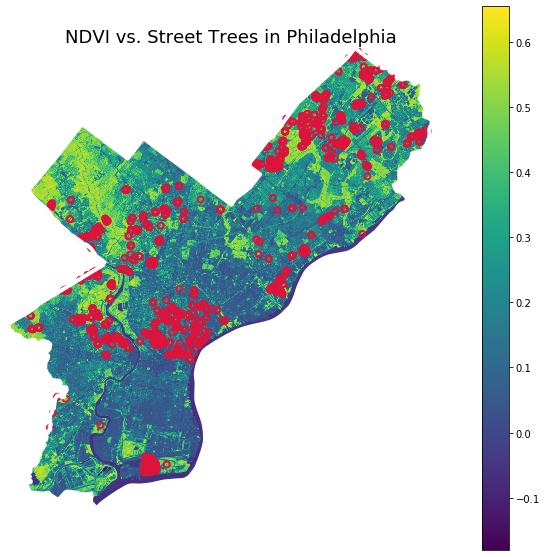

In [235]:
fig, ax = plt.subplots(figsize=(10,10))

# Plot NDVI
img = ax.imshow(NDVI_City, extent=landsat_extent)

# NEW: add the street trees
StreetTree.plot(ax=ax, edgecolor='crimson', facecolor='none', linewidth=2)

# Format and plot city limits
CityLimits.plot(ax=ax, edgecolor='white', facecolor='none', linewidth=4)
plt.colorbar(img)
ax.set_axis_off()
ax.set_title("NDVI vs. Street Trees in Philadelphia", fontsize=18);

In [236]:
NDVI_StreetTree = zonal_stats(StreetTree, NDVI_City, affine=landsat.transform, stats=['median'])

C:\Users\alber\Anaconda3\envs\musa-620\lib\site-packages\rasterstats\io.py:300: UserWarning: Setting nodata to -999; specify nodata explicitly
  warnings.warn("Setting nodata to -999; specify nodata explicitly")


In [237]:
NDVI_StreetTree

[{'median': 0.23533681765389083},
 {'median': 0.26153510526124424},
 {'median': 0.09676935199429665},
 {'median': 0.07662965738028744},
 {'median': 0.2679520805273978},
 {'median': 0.07685867381111855},
 {'median': 0.1051902048359772},
 {'median': 0.09178423236514523},
 {'median': 0.07616818902392995},
 {'median': 0.10229947492304907},
 {'median': 0.10229947492304907},
 {'median': 0.10498730652690197},
 {'median': 0.06877747029138857},
 {'median': 0.06877747029138857},
 {'median': 0.05285700379635939},
 {'median': 0.10498730652690197},
 {'median': 0.12066604995374654},
 {'median': 0.10947590903753572},
 {'median': 0.07507408626934475},
 {'median': 0.03901195843952166},
 {'median': 0.07507408626934475},
 {'median': 0.16205979026451714},
 {'median': 0.16205979026451714},
 {'median': 0.11366006256517205},
 {'median': 0.03710847414985953},
 {'median': 0.06267842415783798},
 {'median': 0.1267991239048811},
 {'median': 0.037040112947429614},
 {'median': 0.053798362044620164},
 {'median': 0.0

In [238]:
# Store the median value in the street tree data frame
StreetTree['NDVI_StreetTree'] = [s['median'] for s in NDVI_StreetTree]

# 2.2.3 Plotting the results

Histogram

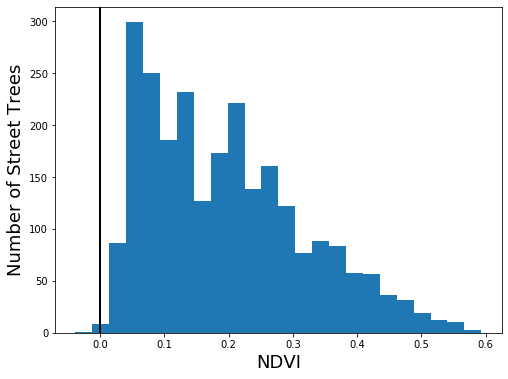

In [239]:
# Initialize
fig, ax = plt.subplots(figsize=(8,6))

# Plot a quick histogram 
ax.hist(StreetTree['NDVI_StreetTree'], bins='auto')
ax.axvline(x=0, c='k', lw=2)

# Format
ax.set_xlabel("NDVI", fontsize=18)
ax.set_ylabel("Number of Street Trees", fontsize=18);

Choropleth

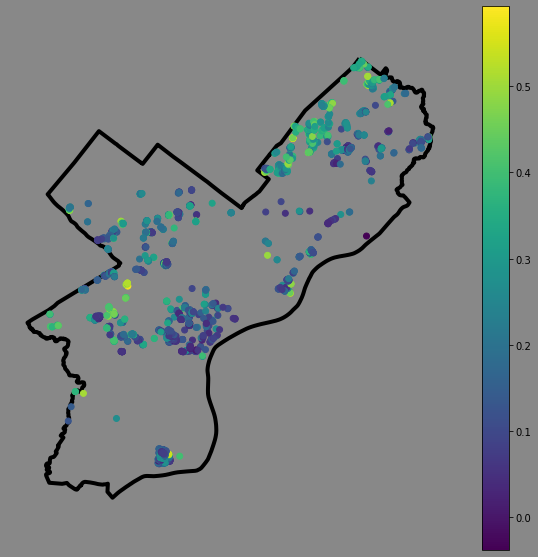

In [240]:
# Initialize
fig, ax = plt.subplots(figsize=(10,10), facecolor='#888888')

# Plot the city limits
CityLimits.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=4)

# Plot the median NDVI
StreetTree.plot(column='NDVI_StreetTree', legend=True, ax=ax)

# Format
ax.set_axis_off()